In [1]:
import scanpy as sc
import squidpy as sq
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


/home/md-adnan-karim/miniconda3/envs/scrna_spatial/lib/python3.11/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


In [2]:
adata = sc.read_h5ad("/home/md-adnan-karim/Documents/CyTOF/ref_analysis/260330/cells.h5ad")

In [7]:
adata

AnnData object with n_obs × n_vars = 47859 × 40
    obs: 'Image', 'area', 'centroid-0', 'centroid-1', 'axis_major_length', 'axis_minor_length', 'eccentricity', 'image', 'image_width_px', 'image_height_px', 'image_num_channels', 'image_source_file', 'image_recovery_file', 'image_recovered', 'image_acquisition_id', 'image_acquisition_description', 'image_acquisition_start_x_um', 'image_acquisition_start_y_um', 'image_acquisition_end_x_um', 'image_acquisition_end_y_um', 'image_acquisition_width_um', 'image_acquisition_height_um'
    var: 'channel', 'name', 'keep', 'ilastik', 'deepcell', 'cellpose', 'Tube Number', 'Target', 'Antibody Clone', 'Stock Concentration', 'Final Concentration / Dilution', 'uL to add'

# Arcsinh normalization

In [3]:
#save raw data to adata.raw
adata.raw = adata.copy()

In [4]:
def arcsinh_transform(x, cofactor = 5):
    return np.arcsinh(x / cofactor)

cofactor selection \
IMC/MIBI: \
Unlike suspension based CyTOF data, most spatial-IMC(CyTOF) and MIBI generally has less background signals. Therefore, a cofactor of 1 is usually recommended [PMID: 37750225].\

Suspension CyTOF: \
Suspension based CyTOF often has more electric noise per signal ratio. Generally, 5 to 15 is recommended.

Fluorosence-based (CODEX):\
Recommended: 150-1000






In [18]:
adata.X = arcsinh_transform(adata.X, cofactor=1)

#next steps:
1. multiple parameters
2. run harmony/scvi batch integration
3. run sillhouette scores on labels

In [22]:
### save the arcsinh transformed data to a new layer
adata.layers["arcsinh_cf_1"] = adata.X.copy()

In [5]:
# Test multiple cofactors (1-15) and save as layers
# Reload raw data first
X_raw = adata.raw.X.copy()

# Test cofactors 1-15
for cofactor in range(1, 6):
    transformed = arcsinh_transform(X_raw, cofactor=cofactor)
    adata.layers[f"arcsinh_cf_{cofactor}"] = transformed.copy()
    print(f"Saved layer: arcsinh_cf_{cofactor}")

print(f"\nTotal layers: {len(adata.layers)}")
print(f"Layers: {list(adata.layers.keys())}")

Saved layer: arcsinh_cf_1
Saved layer: arcsinh_cf_2
Saved layer: arcsinh_cf_3
Saved layer: arcsinh_cf_4
Saved layer: arcsinh_cf_5

Total layers: 5
Layers: ['arcsinh_cf_1', 'arcsinh_cf_2', 'arcsinh_cf_3', 'arcsinh_cf_4', 'arcsinh_cf_5']


# Scanpy-based normalization for all arcsinh cofactor layers

In [6]:
# Perform scanpy normalization for each arcsinh layer
# We'll use library size normalization followed by log1p transformation

arcsinh_layers = [layer for layer in adata.layers.keys() if layer.startswith("arcsinh_cf_")]
print(f"Processing {len(arcsinh_layers)} arcsinh layers...")

for layer_name in sorted(arcsinh_layers):
    # Get the layer data
    X_layer = adata.layers[layer_name].copy()
    
    # Create temporary AnnData object for normalization
    temp_adata = sc.AnnData(X=X_layer)
    
    # Apply scanpy normalization: library size normalization to target sum
    sc.pp.normalize_total(temp_adata, target_sum=1e4, inplace=True)
    
    # Apply log1p transformation
    sc.pp.log1p(temp_adata)
    
    # Save as new layer with _norm suffix
    norm_layer_name = f"{layer_name}_norm"
    adata.layers[norm_layer_name] = temp_adata.X.copy()
    
    print(f"Saved normalized layer: {norm_layer_name}")

print(f"\nTotal layers after normalization: {len(adata.layers)}")
print(f"All layers: {sorted(adata.layers.keys())}")


Processing 5 arcsinh layers...
Saved normalized layer: arcsinh_cf_1_norm
Saved normalized layer: arcsinh_cf_2_norm
Saved normalized layer: arcsinh_cf_3_norm
Saved normalized layer: arcsinh_cf_4_norm
Saved normalized layer: arcsinh_cf_5_norm

Total layers after normalization: 10
All layers: ['arcsinh_cf_1', 'arcsinh_cf_1_norm', 'arcsinh_cf_2', 'arcsinh_cf_2_norm', 'arcsinh_cf_3', 'arcsinh_cf_3_norm', 'arcsinh_cf_4', 'arcsinh_cf_4_norm', 'arcsinh_cf_5', 'arcsinh_cf_5_norm']


In [7]:
sample_metadata = pd.read_csv("/home/md-adnan-karim/Documents/CyTOF/ref_analysis/260330/sample_metadata.csv")

In [30]:
sample_metadata.head()

,Sample ID,Indication
0,Patient1,SCCHN
1,Patient2,BCC
2,Patient3,NSCLC
3,Patient4,CRC


In [8]:
# Add Sample ID from Image column
adata.obs["Sample ID"] = adata.obs["Image"].str.split("_").str[0]

# Merge with sample metadata to add Indication
adata.obs = adata.obs.merge(sample_metadata, on="Sample ID", how="left")

/home/md-adnan-karim/miniconda3/envs/scrna_spatial/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)


In [9]:
adata.write_h5ad("/home/md-adnan-karim/Documents/CyTOF/ref_analysis/260330/cells_preprocessed.h5ad")

/home/md-adnan-karim/miniconda3/envs/scrna_spatial/lib/python3.11/site-packages/anndata/_io/utils.py:243: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)
/home/md-adnan-karim/miniconda3/envs/scrna_spatial/lib/python3.11/site-packages/anndata/_io/utils.py:243: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)


# To test each cofactor normalization, for the next step we will run dimensionality reduction on each normalized matrices.
## Here we will run the PCA for each cofactor normalization matrix

In [10]:


arcsinh_layers = [layer for layer in adata.layers.keys() if layer.endswith("_norm")]
print(f"Processing {len(arcsinh_layers)} arcsinh layers...")

for layer_name in sorted(arcsinh_layers):
    #print(layer_name)

    cofactor_val = layer_name.split("_")[2]
    print(cofactor_val)
   
    X_layer = adata.layers[layer_name].copy()
    
    ## Create temporary AnnData object for normalization
    temp_adata = sc.AnnData(X=X_layer)

    sc.pp.pca(temp_adata, key_added=f"X_pca_{cofactor_val}")
    #print(temp_adata)

    adata.uns[f"X_pca_{cofactor_val}"] = temp_adata.uns[f"X_pca_{cofactor_val}"]

    adata.obsm[f"X_pca_{cofactor_val}"] = temp_adata.obsm[f"X_pca_{cofactor_val}"]
    
    


Processing 5 arcsinh layers...
1
2
3
4
5


In [11]:
# Plot for each cofactor normalized PCs


def plot_multiple_scores(scores_dict, title='Comparison of Score Sets', xlabel='Index', ylabel='Score Value'):
    """
    Plots multiple sets of scores on a single plot for comparison.
    
    Parameters:
    - scores_dict: Dictionary where keys are labels (strings) and values are 1D arrays/lists.
    - title: Title of the plot.
    - xlabel: Label for the x-axis.
    - ylabel: Label for the y-axis.
    """
    # Use a clean plotting style
    plt.style.use('seaborn-v0_8-muted')
    
    # Iterate through the dictionary to plot each line
    for label, scores in scores_dict.items():
        # Ensure input is a numpy array for consistent indexing
        scores_arr = np.array(scores)
        # Plot with markers and a specific label for the legend
        plt.plot(range(1, len(scores_arr) + 1), scores_arr, marker='o', markersize=4, label=label, alpha=0.8)
    
    # Formatting
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    
    # Save the output
    plt.savefig('multiple_scores_plot.png')

# Example Usage:
# scores1 = [0.196, 0.166, 0.091, ...]
# scores2 = [0.150, 0.120, 0.080, ...]
# data = {'Run 1': scores1, 'Run 2': scores2}
# plot_multiple_scores(data)

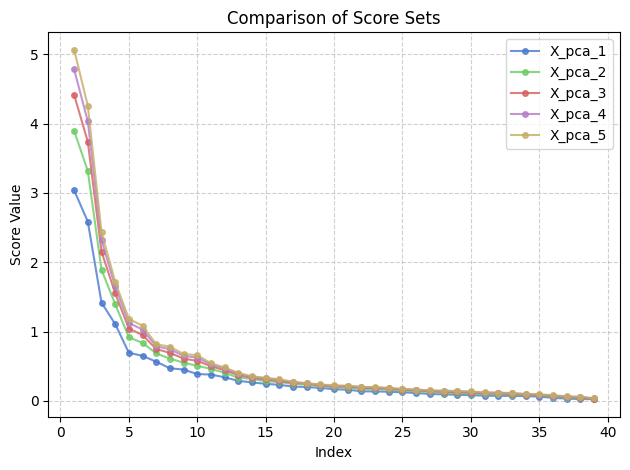

In [12]:

adata.uns["X_pca_2"]
pca_variance_dict = {}

variance_layers = [layer for layer in adata.uns.keys()]

for pca_key in variance_layers:
    pca_variance_dict[pca_key] = adata.uns[pca_key]["variance"]



#plot_multiple_scores(pca_variance_dict)


plot_multiple_scores(pca_variance_dict)



# UMAP

For the next part we will run the umap and plot them for Sample Type and Patients for each cofactor normalization. We used 15 PCs as the variance scores after 15th PC is plateu.
## Here we will run the UMAP for each cofactor normalization matrix

In [14]:


# We use the pca keys

for pca_key in variance_layers:

    ## first run neighbors
    sc.pp.neighbors(adata, use_rep=pca_key, n_pcs=15, key_added=f"{pca_key}_neighbors")

    print(f"Neighboring done: {pca_key}")

    ## run umap
    sc.tl.umap(adata, neighbors_key = f"{pca_key}_neighbors", key_added = f"{pca_key}_umap")

    print(f"UMAP done: {pca_key}")




/home/md-adnan-karim/miniconda3/envs/scrna_spatial/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Neighboring done: X_pca_1
UMAP done: X_pca_1
Neighboring done: X_pca_2
UMAP done: X_pca_2
Neighboring done: X_pca_3
UMAP done: X_pca_3
Neighboring done: X_pca_4
UMAP done: X_pca_4
Neighboring done: X_pca_5
UMAP done: X_pca_5


AnnData object with n_obs × n_vars = 47859 × 40
    obs: 'Image', 'area', 'centroid-0', 'centroid-1', 'axis_major_length', 'axis_minor_length', 'eccentricity', 'image', 'image_width_px', 'image_height_px', 'image_num_channels', 'image_source_file', 'image_recovery_file', 'image_recovered', 'image_acquisition_id', 'image_acquisition_description', 'image_acquisition_start_x_um', 'image_acquisition_start_y_um', 'image_acquisition_end_x_um', 'image_acquisition_end_y_um', 'image_acquisition_width_um', 'image_acquisition_height_um', 'Sample ID', 'Indication'
    var: 'channel', 'name', 'keep', 'ilastik', 'deepcell', 'cellpose', 'Tube Number', 'Target', 'Antibody Clone', 'Stock Concentration', 'Final Concentration / Dilution', 'uL to add'
    uns: 'X_pca_1', 'X_pca_2', 'X_pca_3', 'X_pca_4', 'X_pca_5', 'X_pca_1_neighbors', 'X_pca_1_umap', 'X_pca_2_neighbors', 'X_pca_2_umap', 'X_pca_3_neighbors', 'X_pca_3_umap', 'X_pca_4_neighbors', 'X_pca_4_umap', 'X_pca_5_neighbors', 'X_pca_5_umap'
    obsm: 

# Lets plot the UMAPs 

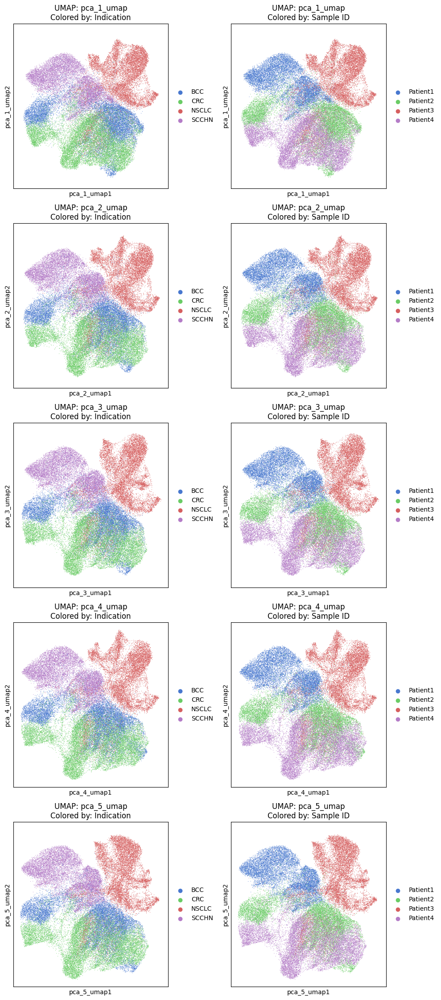

In [20]:
# List the UMAP keys and color variables for plotting
umap_keys = [i for i in adata.obsm if i.endswith("_umap")]
colors_to_plot = ["Indication", "Sample ID"]


n_rows = len(umap_keys)
n_cols = len(colors_to_plot)

# We make the figure taller than it is wide to emphasize the stacking.
fig, axs = plt.subplots(
    nrows=n_rows, 
    ncols=n_cols, 
    figsize=(5 * n_cols, 4.5 * n_rows),
    sharex=True,
    sharey=True
)


# Loop through the UMAP slots (Rows)
for i, umap_key in enumerate(umap_keys):
    
    clean_basis_key = umap_key.replace("X_", "")
    
    # Loop through color variables (Columns)
    for j, color_var in enumerate(colors_to_plot):
        
        # Access the specific ax for this row/column combination
        current_ax = axs[i, j]
        
        # Call sc.pl.embedding, explicitly assigning the ax
        sc.pl.embedding(
            adata,
            basis=clean_basis_key,
            color=color_var,
            ax=current_ax,      # <--- IMPORTANT
            show=False,        # <--- IMPORTANT
            wspace=0.3,
            # Customize titles per axis
            title=f"UMAP: {clean_basis_key}\nColored by: {color_var}"
        )

# --- 4. Final Final Adjustments ---
# Remove any overlapping labels or titles
plt.tight_layout()

# display the final stacked grid
plt.show()

As the samples look splitted for each patients, we would like to run a batch integration.

# Harmony Integration

In [17]:

for pca_key in variance_layers:

    sc.external.pp.harmony_integrate(adata, key="Sample ID", basis=pca_key, adjusted_basis=f"harmony_{pca_key}")

2026-03-31 11:05:38,737 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2026-03-31 11:05:42,815 - harmonypy - INFO - sklearn.KMeans initialization complete.
2026-03-31 11:05:43,017 - harmonypy - INFO - Iteration 1 of 10
2026-03-31 11:05:53,828 - harmonypy - INFO - Iteration 2 of 10
2026-03-31 11:06:03,979 - harmonypy - INFO - Iteration 3 of 10
2026-03-31 11:06:14,146 - harmonypy - INFO - Iteration 4 of 10
2026-03-31 11:06:24,311 - harmonypy - INFO - Iteration 5 of 10
2026-03-31 11:06:34,576 - harmonypy - INFO - Iteration 6 of 10
2026-03-31 11:06:42,035 - harmonypy - INFO - Iteration 7 of 10
2026-03-31 11:06:48,904 - harmonypy - INFO - Iteration 8 of 10
2026-03-31 11:06:54,430 - harmonypy - INFO - Iteration 9 of 10
2026-03-31 11:07:01,731 - harmonypy - INFO - Iteration 10 of 10
2026-03-31 11:07:07,151 - harmonypy - INFO - Stopped before convergence
2026-03-31 11:07:07,206 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2026-03-31 11:07:11,

In [18]:
adata

AnnData object with n_obs × n_vars = 47859 × 40
    obs: 'Image', 'area', 'centroid-0', 'centroid-1', 'axis_major_length', 'axis_minor_length', 'eccentricity', 'image', 'image_width_px', 'image_height_px', 'image_num_channels', 'image_source_file', 'image_recovery_file', 'image_recovered', 'image_acquisition_id', 'image_acquisition_description', 'image_acquisition_start_x_um', 'image_acquisition_start_y_um', 'image_acquisition_end_x_um', 'image_acquisition_end_y_um', 'image_acquisition_width_um', 'image_acquisition_height_um', 'Sample ID', 'Indication'
    var: 'channel', 'name', 'keep', 'ilastik', 'deepcell', 'cellpose', 'Tube Number', 'Target', 'Antibody Clone', 'Stock Concentration', 'Final Concentration / Dilution', 'uL to add'
    uns: 'X_pca_1', 'X_pca_2', 'X_pca_3', 'X_pca_4', 'X_pca_5', 'X_pca_1_neighbors', 'X_pca_1_umap', 'X_pca_2_neighbors', 'X_pca_2_umap', 'X_pca_3_neighbors', 'X_pca_3_umap', 'X_pca_4_neighbors', 'X_pca_4_umap', 'X_pca_5_neighbors', 'X_pca_5_umap', 'Indicati

In [23]:


# We use the pca keys

harmony_pca_keys = [key for key in adata.obsm.keys() if key.startswith("harmony_X_pca_")]

for harmony_pca_key in harmony_pca_keys:

    ## first run neighbors
    sc.pp.neighbors(adata, use_rep=harmony_pca_key, n_pcs=15, key_added=f"{harmony_pca_key}_neighbors")

    print(f"Neighboring done: {harmony_pca_key}")

    ## run umap
    sc.tl.umap(adata, neighbors_key = f"{harmony_pca_key}_neighbors", key_added = f"{harmony_pca_key}_umap")

    print(f"UMAP done: {harmony_pca_key}")




Neighboring done: harmony_X_pca_1
UMAP done: harmony_X_pca_1
Neighboring done: harmony_X_pca_2
UMAP done: harmony_X_pca_2
Neighboring done: harmony_X_pca_3
UMAP done: harmony_X_pca_3
Neighboring done: harmony_X_pca_4
UMAP done: harmony_X_pca_4
Neighboring done: harmony_X_pca_5
UMAP done: harmony_X_pca_5


In [24]:
adata

AnnData object with n_obs × n_vars = 47859 × 40
    obs: 'Image', 'area', 'centroid-0', 'centroid-1', 'axis_major_length', 'axis_minor_length', 'eccentricity', 'image', 'image_width_px', 'image_height_px', 'image_num_channels', 'image_source_file', 'image_recovery_file', 'image_recovered', 'image_acquisition_id', 'image_acquisition_description', 'image_acquisition_start_x_um', 'image_acquisition_start_y_um', 'image_acquisition_end_x_um', 'image_acquisition_end_y_um', 'image_acquisition_width_um', 'image_acquisition_height_um', 'Sample ID', 'Indication'
    var: 'channel', 'name', 'keep', 'ilastik', 'deepcell', 'cellpose', 'Tube Number', 'Target', 'Antibody Clone', 'Stock Concentration', 'Final Concentration / Dilution', 'uL to add'
    uns: 'X_pca_1', 'X_pca_2', 'X_pca_3', 'X_pca_4', 'X_pca_5', 'X_pca_1_neighbors', 'X_pca_1_umap', 'X_pca_2_neighbors', 'X_pca_2_umap', 'X_pca_3_neighbors', 'X_pca_3_umap', 'X_pca_4_neighbors', 'X_pca_4_umap', 'X_pca_5_neighbors', 'X_pca_5_umap', 'Indicati

UMAP keys found: ['harmony_X_pca_1_umap', 'harmony_X_pca_2_umap', 'harmony_X_pca_3_umap', 'harmony_X_pca_4_umap', 'harmony_X_pca_5_umap']


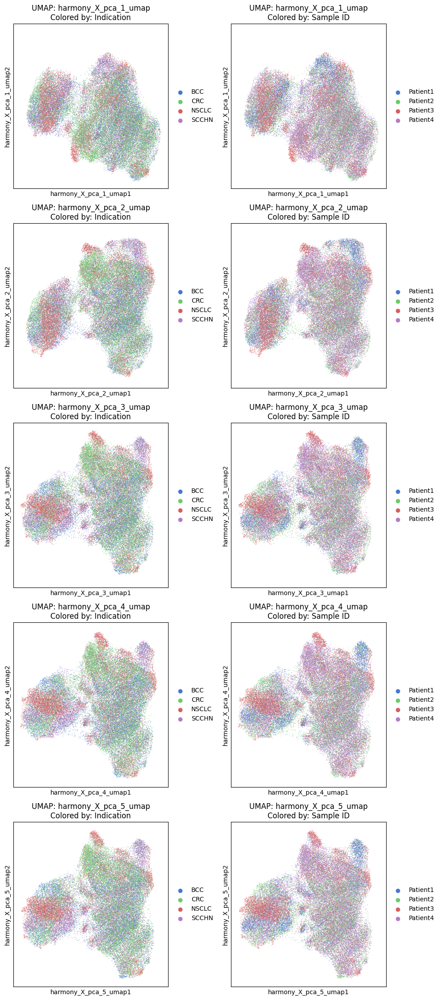

In [27]:
# List the UMAP keys and color variables for plotting
umap_keys = [i for i in adata.obsm if i.startswith("harmony") and i.endswith("_umap")]
print(f"UMAP keys found: {umap_keys}")
colors_to_plot = ["Indication", "Sample ID"]


n_rows = len(umap_keys)
n_cols = len(colors_to_plot)

# We make the figure taller than it is wide to emphasize the stacking.
fig, axs = plt.subplots(
    nrows=n_rows, 
    ncols=n_cols, 
    figsize=(5 * n_cols, 4.5 * n_rows),
    sharex=True,
    sharey=True
)


# Loop through the UMAP slots (Rows)
for i, umap_key in enumerate(umap_keys):
    
    clean_basis_key = umap_key
    
    # Loop through color variables (Columns)
    for j, color_var in enumerate(colors_to_plot):
        
        # Access the specific ax for this row/column combination
        current_ax = axs[i, j]
        
        # Call sc.pl.embedding, explicitly assigning the ax
        sc.pl.embedding(
            adata,
            basis=clean_basis_key,
            color=color_var,
            ax=current_ax,      # <--- IMPORTANT
            show=False,        # <--- IMPORTANT
            wspace=0.3,
            # Customize titles per axis
            title=f"UMAP: {clean_basis_key}\nColored by: {color_var}"
        )

# --- 4. Final Final Adjustments ---
# Remove any overlapping labels or titles
plt.tight_layout()

# display the final stacked grid
plt.show()

In [28]:
adata.write_h5ad("/home/md-adnan-karim/Documents/CyTOF/ref_analysis/260330/cells_preprocessed_harmony_integration.h5ad")

/home/md-adnan-karim/miniconda3/envs/scrna_spatial/lib/python3.11/site-packages/anndata/_io/utils.py:243: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)
/home/md-adnan-karim/miniconda3/envs/scrna_spatial/lib/python3.11/site-packages/anndata/_io/utils.py:243: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)


# Silhouette Score Analysis for Batch Effect Evaluation

In [30]:
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.pyplot as plt

# Calculate silhouette scores for pre-harmony and harmony UMAPs
# We'll use the PCA representations (not UMAP) for this analysis since silhouette is based on distances

def calculate_silhouette_metrics(adata, pca_key, batch_key="Sample ID"):
    """
    Calculate silhouette scores for batch correction evaluation.
    
    Parameters:
    - adata: AnnData object
    - pca_key: Key to the PCA representation in adata.obsm
    - batch_key: Column name in adata.obs for batch labels
    
    Returns:
    - silhouette_avg: Average silhouette score (-1 to 1, higher is better)
    - silhouette_vals: Individual silhouette scores for each cell
    """
    X = adata.obsm[pca_key]
    labels = adata.obs[batch_key].values
    
    # Convert categorical labels to numeric
    label_map = {label: idx for idx, label in enumerate(adata.obs[batch_key].unique())}
    labels_numeric = np.array([label_map[label] for label in labels])
    
    silhouette_avg = silhouette_score(X, labels_numeric)
    silhouette_vals = silhouette_samples(X, labels_numeric)
    
    return silhouette_avg, silhouette_vals, label_map



In [40]:
print(adata.obsm["X_pca_1_umap"].max())
print(adata.obsm["X_pca_1_umap"].min())

16.56317
-3.7857225


In [41]:
print(adata.obsm["harmony_X_pca_1_umap"].max())
print(adata.obsm["harmony_X_pca_1_umap"].min())

15.429708
-3.104096


In [50]:
# Get all PCA keys (pre-harmony)
pre_harmony_umap_keys = [key for key in adata.obsm.keys() if key.startswith("X_pca_") and not key.endswith("_umap")]
harmony_umap_keys = [key for key in adata.obsm.keys() if key.startswith("harmony_X_pca_") and not key.endswith("_umap")]

In [53]:


print("Pre-harmony UMAP keys:", pre_harmony_umap_keys)
print("Harmony UMAP keys:", harmony_umap_keys)
# Store results
silhouette_results = {}

# Calculate for pre-harmony
print("\n=== Pre-Harmony Silhouette Scores ===")
for umap_key in sorted(pre_harmony_umap_keys):
    sil_avg, sil_vals, label_map = calculate_silhouette_metrics(adata, umap_key, batch_key="Sample ID")
    silhouette_results[f"Pre-Harmony {umap_key}"] = {
        "avg": sil_avg,
        "vals": sil_vals,
        "label_map": label_map
    }
    print(f"{umap_key}: {sil_avg:.4f}")

# Calculate for harmony
print("\n=== Harmony-Integrated Silhouette Scores ===")
for umap_key in sorted(harmony_umap_keys):
    sil_avg, sil_vals, label_map = calculate_silhouette_metrics(adata, umap_key, batch_key="Sample ID")
    silhouette_results[f"Harmony {umap_key}"] = {
        "avg": sil_avg,
        "vals": sil_vals,
        "label_map": label_map
    }
    print(f"{umap_key}: {sil_avg:.4f}")

print("\nNote: Higher silhouette scores indicate better batch integration (less batch effect)")


Pre-harmony UMAP keys: ['X_pca_1', 'X_pca_2', 'X_pca_3', 'X_pca_4', 'X_pca_5']
Harmony UMAP keys: ['harmony_X_pca_1', 'harmony_X_pca_2', 'harmony_X_pca_3', 'harmony_X_pca_4', 'harmony_X_pca_5']

=== Pre-Harmony Silhouette Scores ===
X_pca_1: 0.0215
X_pca_2: 0.0294
X_pca_3: 0.0335
X_pca_4: 0.0361
X_pca_5: 0.0382

=== Harmony-Integrated Silhouette Scores ===
harmony_X_pca_1: -0.0466
harmony_X_pca_2: -0.0393
harmony_X_pca_3: -0.0357
harmony_X_pca_4: -0.0337
harmony_X_pca_5: -0.0324

Note: Higher silhouette scores indicate better batch integration (less batch effect)


# Lets run unsupervised clustering and identify each cluster based on dominant marker expression pattern

In [56]:
adata

AnnData object with n_obs × n_vars = 47859 × 40
    obs: 'Image', 'area', 'centroid-0', 'centroid-1', 'axis_major_length', 'axis_minor_length', 'eccentricity', 'image', 'image_width_px', 'image_height_px', 'image_num_channels', 'image_source_file', 'image_recovery_file', 'image_recovered', 'image_acquisition_id', 'image_acquisition_description', 'image_acquisition_start_x_um', 'image_acquisition_start_y_um', 'image_acquisition_end_x_um', 'image_acquisition_end_y_um', 'image_acquisition_width_um', 'image_acquisition_height_um', 'Sample ID', 'Indication', 'X_pca_1_neighbors_leiden', 'X_pca_2_neighbors_leiden', 'X_pca_3_neighbors_leiden', 'X_pca_4_neighbors_leiden', 'X_pca_5_neighbors_leiden', 'harmony_X_pca_1_neighbors_leiden', 'harmony_X_pca_2_neighbors_leiden', 'harmony_X_pca_3_neighbors_leiden', 'harmony_X_pca_4_neighbors_leiden', 'harmony_X_pca_5_neighbors_leiden'
    var: 'channel', 'name', 'keep', 'ilastik', 'deepcell', 'cellpose', 'Tube Number', 'Target', 'Antibody Clone', 'Stock 

# Leiden Clustering

In [ ]:
# Get all neighbor keys (both pre-harmony and harmony)
neighbor_keys = [key for key in adata.uns.keys() if key.endswith("_neighbors")]
print(f"Found {len(neighbor_keys)} neighbor connectivity matrices:")

for key in neighbor_keys:
    sc.tl.leiden(adata, neighbors_key=key, key_added=f"{key}_leiden", resolution=0.5)


Found 10 neighbor connectivity matrices:


UMAP keys found: ['harmony_X_pca_1_umap', 'harmony_X_pca_2_umap', 'harmony_X_pca_3_umap', 'harmony_X_pca_4_umap', 'harmony_X_pca_5_umap']


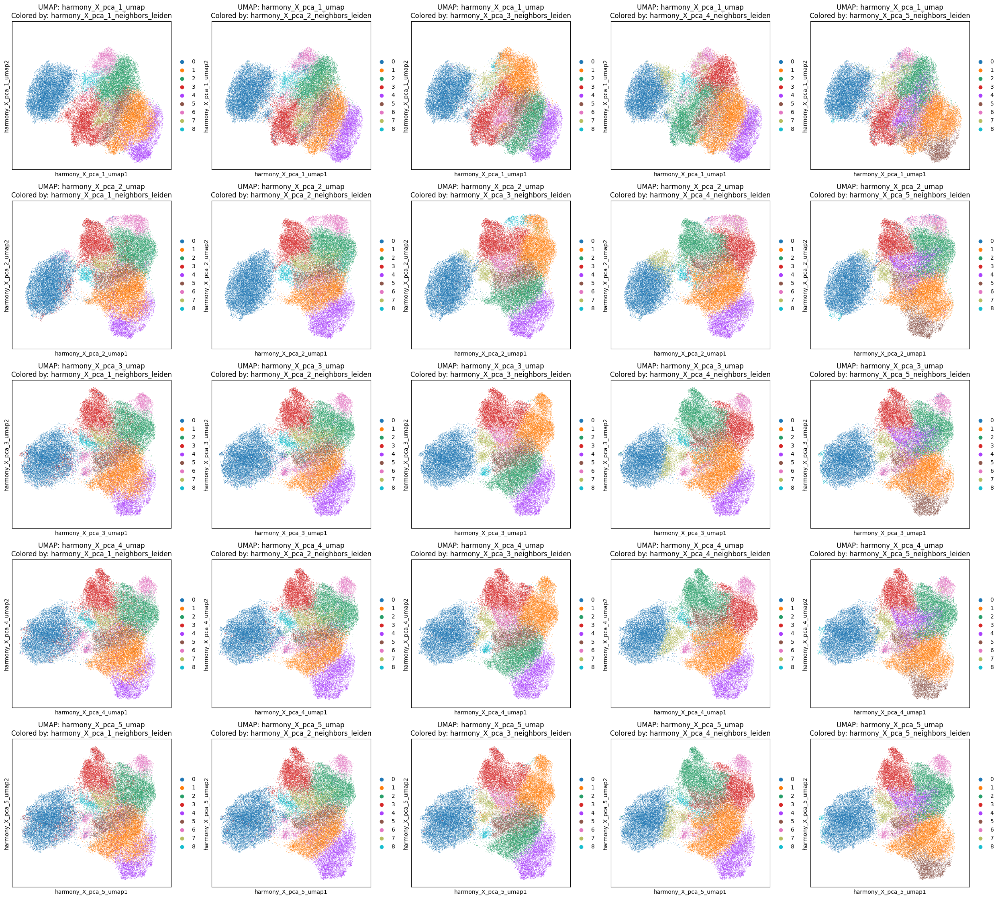

In [66]:
# List the UMAP keys and color variables for plotting
umap_keys = [i for i in adata.obsm if i.startswith("harmony") and i.endswith("_umap")]
print(f"UMAP keys found: {umap_keys}")
colors_to_plot = ['harmony_X_pca_1_neighbors_leiden', 'harmony_X_pca_2_neighbors_leiden', 'harmony_X_pca_3_neighbors_leiden', 'harmony_X_pca_4_neighbors_leiden', 'harmony_X_pca_5_neighbors_leiden']


n_rows = len(umap_keys)
n_cols = len(colors_to_plot)

# We make the figure taller than it is wide to emphasize the stacking.
fig, axs = plt.subplots(
    nrows=n_rows, 
    ncols=n_cols, 
    figsize=(5 * n_cols, 4.5 * n_rows),
    sharex=True,
    sharey=True
)


# Loop through the UMAP slots (Rows)
for i, umap_key in enumerate(umap_keys):
    
    clean_basis_key = umap_key
    
    # Loop through color variables (Columns)
    for j, color_var in enumerate(colors_to_plot):
        
        # Access the specific ax for this row/column combination
        current_ax = axs[i, j]
        
        # Call sc.pl.embedding, explicitly assigning the ax
        sc.pl.embedding(
            adata,
            basis=clean_basis_key,
            color=color_var,
            ax=current_ax,      # <--- IMPORTANT
            show=False,        # <--- IMPORTANT
            wspace=0.3,
            # Customize titles per axis
            title=f"UMAP: {clean_basis_key}\nColored by: {color_var}"
        )

# --- 4. Final Final Adjustments ---
# Remove any overlapping labels or titles
plt.tight_layout()

# display the final stacked grid
plt.show()

In [ ]:
cluster_map = {
    "0" : "Epithelial_cell_(Ecad)",
    "1" : "T_CD8(CD3)",
    "2" : "Myeloid_cell_(CD68)",
    "3" : "Fibroblast_(PDGFRB)",
    "4" : "B_cell_(CD20)",
    "5" : "T_CD4(CD3)",
    "6" : "Proliferating_Myeloid_cell_(CD68)",
    "7" : "Unannotated_cluster",
    "8" : "Granulocyte/Myeloid_cell_(CD15+CD68)",
}

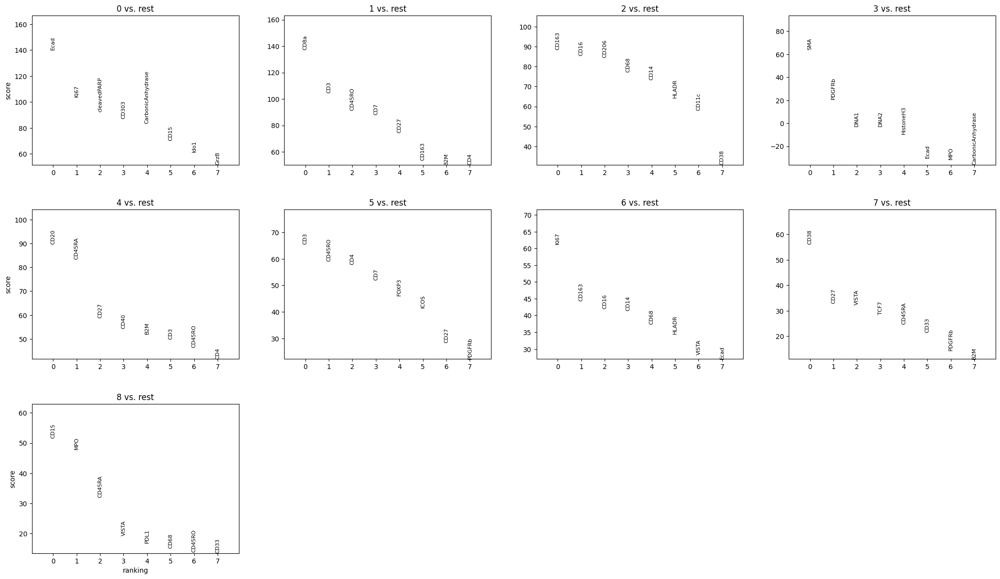

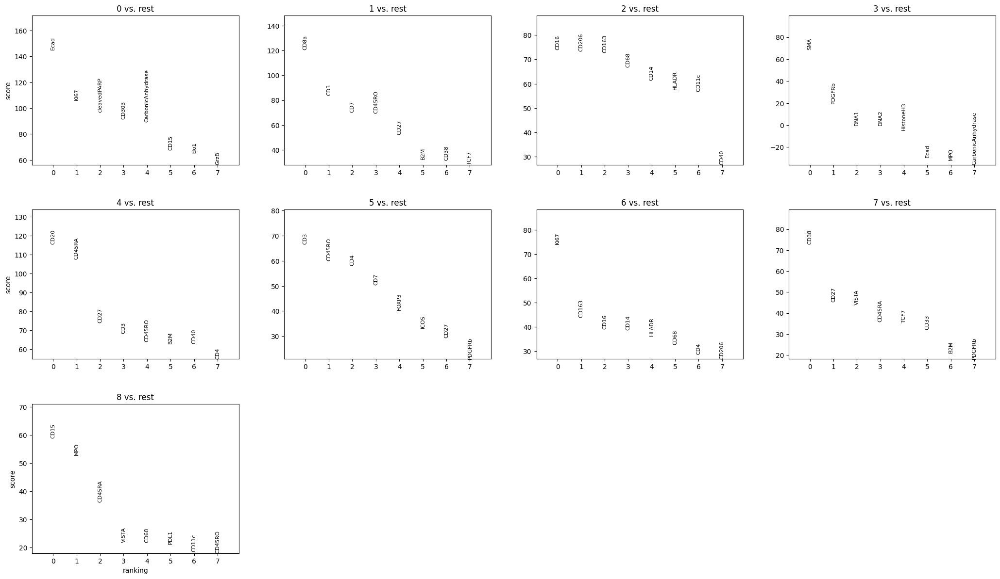

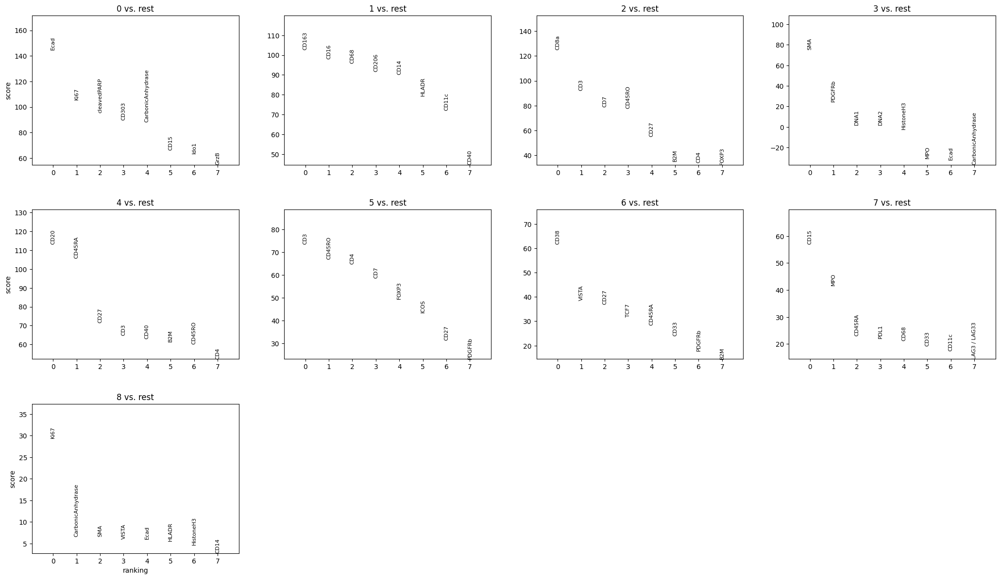

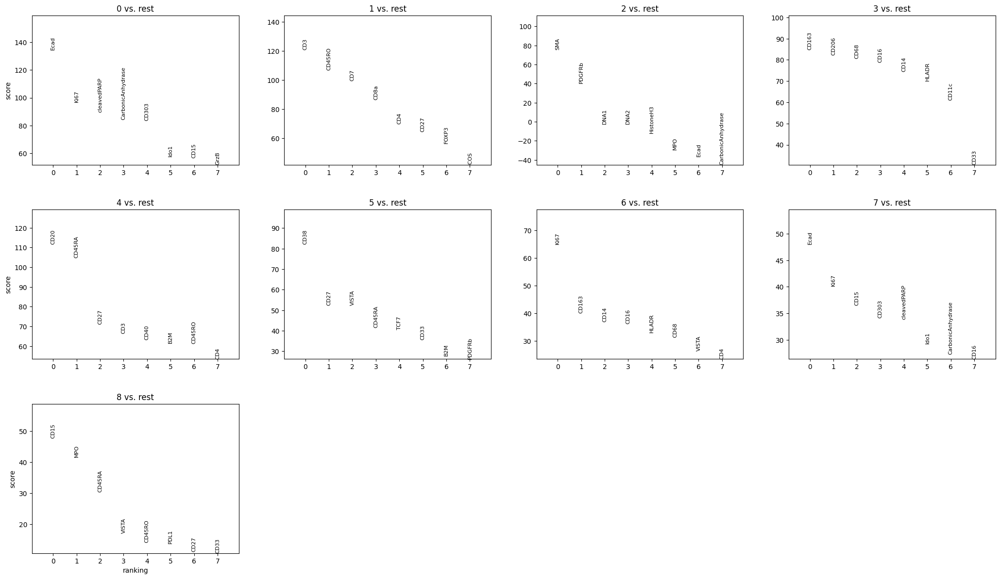

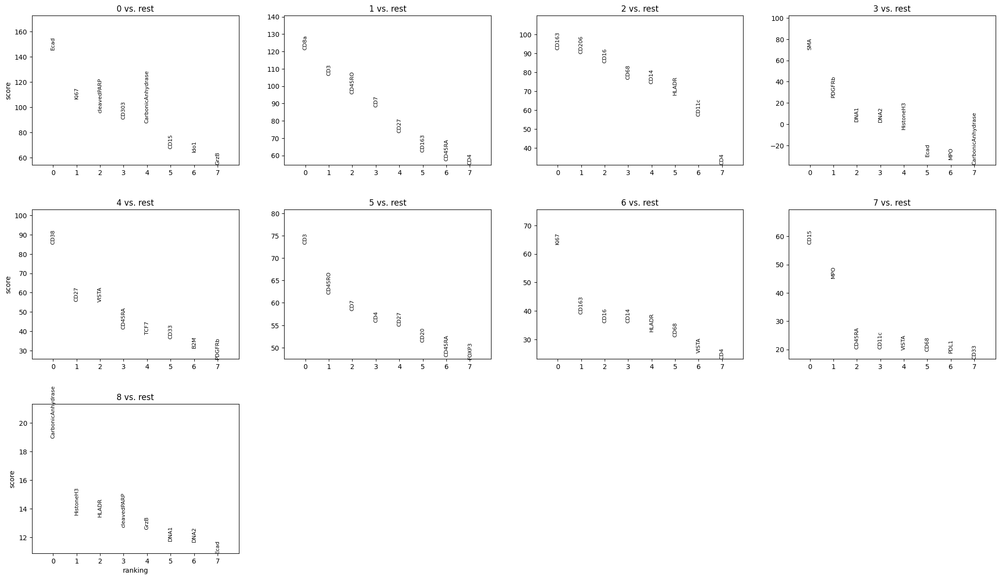

In [61]:
for i in ['harmony_X_pca_1_neighbors_leiden', 'harmony_X_pca_2_neighbors_leiden', 
          'harmony_X_pca_3_neighbors_leiden', 'harmony_X_pca_4_neighbors_leiden', 
          'harmony_X_pca_5_neighbors_leiden']:

    sc.tl.rank_genes_groups(adata, groupby=i, method="wilcoxon", key_added=f"leiden_markers_{i}")
    sc.pl.rank_genes_groups(adata, key=f"leiden_markers_{i}", n_genes=8, sharey=False)

# Map annotation to harmony cofactor 1 norm 

In [67]:
cluster_map = {
    "0" : "Epithelial_cell_(Ecad)",
    "1" : "T_CD8(CD3)",
    "2" : "Myeloid_cell_(CD68)",
    "3" : "Fibroblast_(PDGFRB)",
    "4" : "B_cell_(CD20)",
    "5" : "T_CD4(CD3)",
    "6" : "Proliferating_Myeloid_cell_(CD68)",
    "7" : "Unannotated_cluster",
    "8" : "Granulocyte/Myeloid_cell_(CD15+CD68)",
}

In [68]:
adata.obs["annotation"] = adata.obs["harmony_X_pca_1_neighbors_leiden"].map(cluster_map)

In [69]:
adata.obs["annotation"].value_counts()

annotation
Epithelial_cell_(Ecad)                  11736
T_CD8(CD3)                               9280
Myeloid_cell_(CD68)                      7416
Fibroblast_(PDGFRB)                      6872
B_cell_(CD20)                            3767
T_CD4(CD3)                               3578
Proliferating_Myeloid_cell_(CD68)        2427
Unannotated_cluster                      1660
Granulocyte/Myeloid_cell_(CD15+CD68)     1123
Name: count, dtype: int64

UMAP keys found: ['harmony_X_pca_1_umap', 'harmony_X_pca_2_umap', 'harmony_X_pca_3_umap', 'harmony_X_pca_4_umap', 'harmony_X_pca_5_umap']


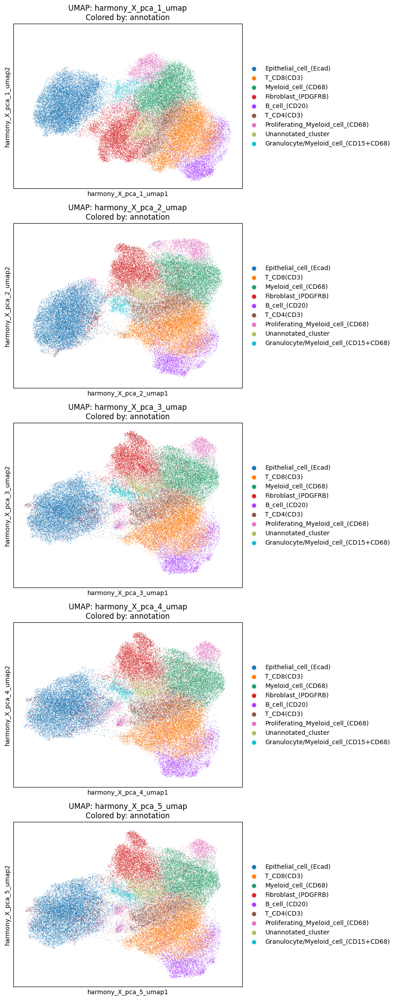

In [74]:
# List the UMAP keys and color variables for plotting
umap_keys = [i for i in adata.obsm if i.startswith("harmony") and i.endswith("_umap")]
print(f"UMAP keys found: {umap_keys}")
colors_to_plot = ['annotation']


n_rows = len(umap_keys)
n_cols = len(colors_to_plot)

# We make the figure taller than it is wide to emphasize the stacking.
fig, axs = plt.subplots(
    nrows=n_rows, 
    ncols=n_cols, 
    figsize=(9 * n_cols, 4.5 * n_rows),
    sharex=True,
    sharey=True
)


# Loop through the UMAP slots (Rows)
for i, umap_key in enumerate(umap_keys):
    
    clean_basis_key = umap_key
    
    # Loop through color variables (Columns)
    for j, color_var in enumerate(colors_to_plot):
        
        # Access the specific ax for this row/column combination
        current_ax = axs[i]
        
        # Call sc.pl.embedding, explicitly assigning the ax
        sc.pl.embedding(
            adata,
            basis=clean_basis_key,
            color=color_var,
            ax=current_ax,      # <--- IMPORTANT
            show=False,        # <--- IMPORTANT
            wspace=0.3,
            # Customize titles per axis
            title=f"UMAP: {clean_basis_key}\nColored by: {color_var}"
        )

# --- 4. Final Final Adjustments ---
# Remove any overlapping labels or titles
plt.tight_layout()

# display the final stacked grid
plt.show()

# Run S score on annotation

In [75]:


print("Pre-harmony UMAP keys:", pre_harmony_umap_keys)
print("Harmony UMAP keys:", harmony_umap_keys)
# Store results
silhouette_results = {}


# Calculate for harmony
print("\n=== Harmony-Integrated Silhouette Scores ===")
for umap_key in sorted(harmony_umap_keys):
    sil_avg, sil_vals, label_map = calculate_silhouette_metrics(adata, umap_key, batch_key="annotation")
    silhouette_results[f"Harmony {umap_key}"] = {
        "avg": sil_avg,
        "vals": sil_vals,
        "label_map": label_map
    }
    print(f"{umap_key}: {sil_avg:.4f}")

print("\nNote: Higher silhouette scores indicate better batch integration (less batch effect)")


Pre-harmony UMAP keys: ['X_pca_1', 'X_pca_2', 'X_pca_3', 'X_pca_4', 'X_pca_5']
Harmony UMAP keys: ['harmony_X_pca_1', 'harmony_X_pca_2', 'harmony_X_pca_3', 'harmony_X_pca_4', 'harmony_X_pca_5']

=== Harmony-Integrated Silhouette Scores ===
harmony_X_pca_1: 0.0897
harmony_X_pca_2: 0.0978
harmony_X_pca_3: 0.1009
harmony_X_pca_4: 0.1031
harmony_X_pca_5: 0.1035

Note: Higher silhouette scores indicate better batch integration (less batch effect)
